In [547]:
import pandas as pd
import numpy as np 
import seaborn as sns                       #visualisation
import matplotlib.pyplot as plt             #visualisation

%matplotlib inline 

from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, StratifiedKFold,GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier as GDBSklearn
from xgboost import XGBClassifier

from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN, AgglomerativeClustering, MeanShift, estimate_bandwidth
from sklearn.mixture import GaussianMixture
from sklearn.metrics.cluster import homogeneity_score, completeness_score, v_measure_score, silhouette_score
from sklearn import decomposition
from sklearn.decomposition import PCA
import plotly.express as px
from sklearn.neighbors import kneighbors_graph

In [517]:
df=pd.read_csv('car_price_prediction.csv')

In [518]:
df

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
1,44731507,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,04-May,Left wheel,Black,8
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,45798355,8467,-,MERCEDES-BENZ,CLK 200,1999,Coupe,Yes,CNG,2.0 Turbo,300000 km,4.0,Manual,Rear,02-Mar,Left wheel,Silver,5
19233,45778856,15681,831,HYUNDAI,Sonata,2011,Sedan,Yes,Petrol,2.4,161600 km,4.0,Tiptronic,Front,04-May,Left wheel,Red,8
19234,45804997,26108,836,HYUNDAI,Tucson,2010,Jeep,Yes,Diesel,2,116365 km,4.0,Automatic,Front,04-May,Left wheel,Grey,4
19235,45793526,5331,1288,CHEVROLET,Captiva,2007,Jeep,Yes,Diesel,2,51258 km,4.0,Automatic,Front,04-May,Left wheel,Black,4


In [519]:
# удаление дубликатов
df=df.drop_duplicates()

In [520]:
df=df.drop(columns=['ID','Levy','Model','Color','Manufacturer'])

In [521]:
df.Category.value_counts()

Sedan          8600
Jeep           5378
Hatchback      2799
Minivan         633
Coupe           528
Universal       361
Microbus        299
Goods wagon     229
Pickup           51
Cabriolet        35
Limousine        11
Name: Category, dtype: int64

In [522]:
df=df[(df.Category =='Sedan')|(df.Category =='Jeep')|(df.Category =='Hatchback')|(df.Category =='Minivan')|(df.Category =='Coupe')]

In [523]:
le=LabelEncoder()
le.fit(df['Category'])
df['Category']=le.transform(df['Category'])

le=LabelEncoder()
le.fit(df['Leather interior'])
df['Leather interior']=le.transform(df['Leather interior'])

le=LabelEncoder()
le.fit(df['Fuel type'])
df['Fuel type']=le.transform(df['Fuel type'])

le=LabelEncoder()
le.fit(df['Gear box type'])
df['Gear box type']=le.transform(df['Gear box type'])

le=LabelEncoder()
le.fit(df['Drive wheels'])
df['Drive wheels']=le.transform(df['Drive wheels'])

le=LabelEncoder()
le.fit(df['Wheel'])
df['Wheel']=le.transform(df['Wheel'])

#выделение чисел в строковых данных
df['Mileage']=pd.to_numeric(df['Mileage'].str.split(' ',expand=True)[0])
df['Doors']=pd.to_numeric(df['Doors'].str.split('-',expand=True)[0].apply(lambda x:x[1]))
df['Engine volume']=pd.to_numeric(df['Engine volume'].str.split(' ',expand=True)[0])

D:\Users\Ivan\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.

D:\Users\Ivan\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.

D:\Users\Ivan\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.



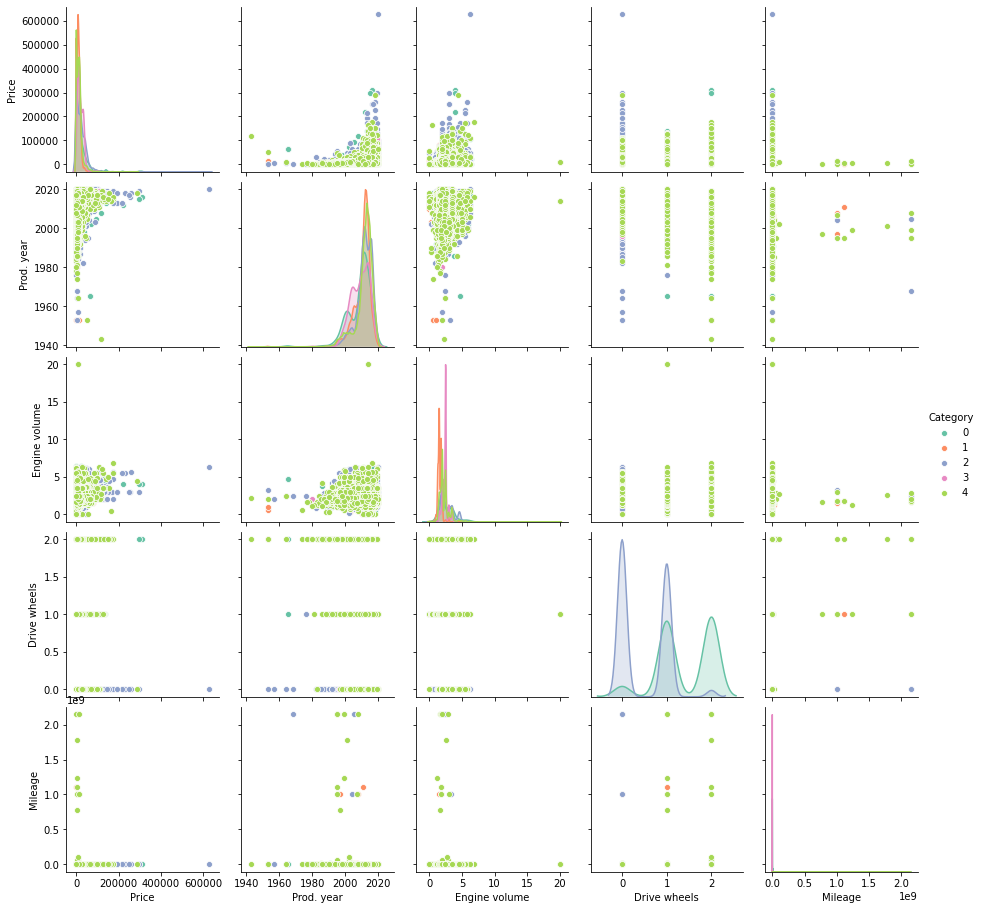

In [524]:
cols_plot=['Price','Prod. year','Engine volume','Drive wheels','Mileage','Category']
sns.pairplot(df[cols_plot],hue='Category',palette='Set2')

In [525]:
#удаление выбросов по цене
q1=df.Price.quantile(0.25)
q3=df.Price.quantile(0.75)
df=df[(df.Price<(q3 + 1.5 * (q3-q1)))&((df.Price>(q1 - 1.5 * (q3-q1))))]

#удаление выбросов по пробегу автомобилей
q1=df.Mileage.quantile(0.25)
q3=df.Mileage.quantile(0.75)
df=df[(df.Mileage<(q3 + 1.5 * (q3-q1)))&((df.Mileage>(q1 - 1.5 * (q3-q1))))]

D:\Users\Ivan\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.

D:\Users\Ivan\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.

D:\Users\Ivan\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning:

Default bandwidth for data is 0; skipping density estimation.



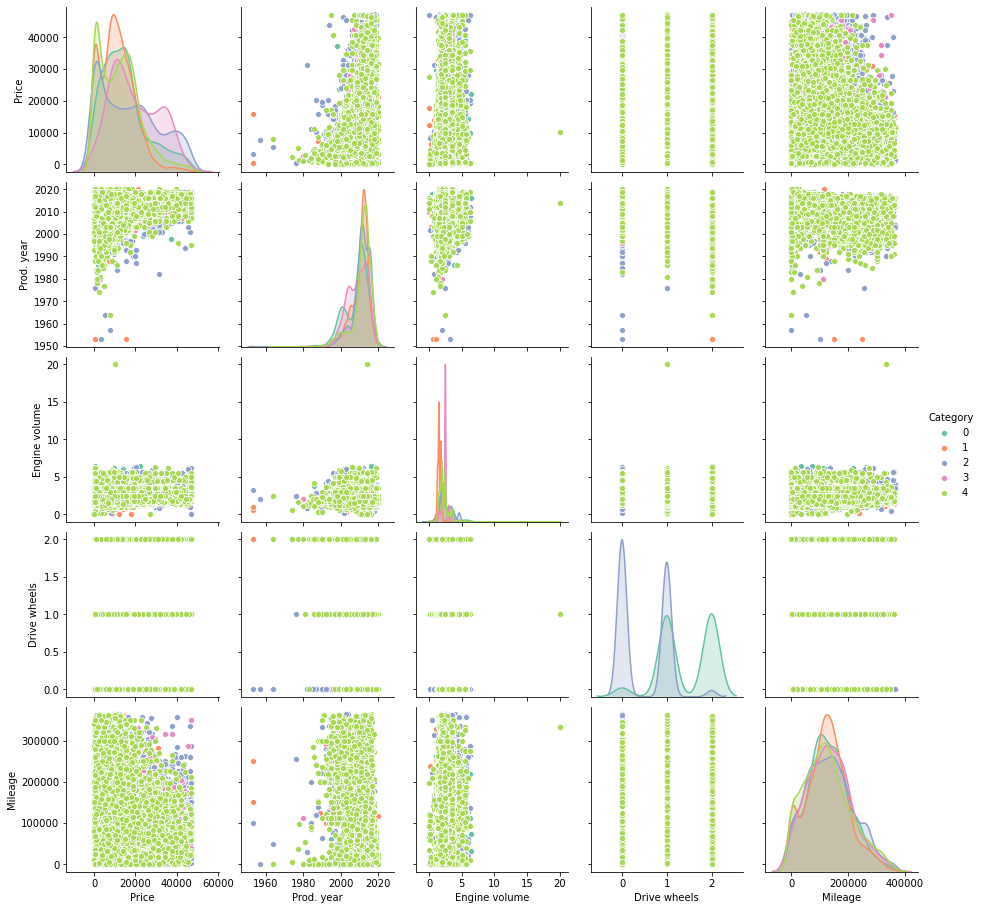

In [526]:
cols_plot=['Price','Prod. year','Engine volume','Drive wheels','Mileage','Category']
sns.pairplot(df[cols_plot],hue='Category',palette='Set2')

In [527]:
y=df['Category']
X=df.drop(columns='Category')

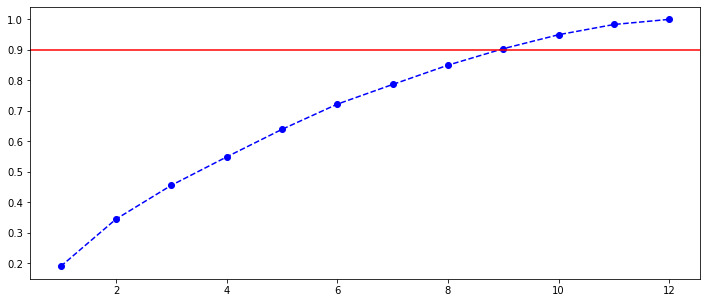

In [528]:
X_scaled=StandardScaler().fit_transform(X)

pca=PCA().fit(X_scaled)

plt.figure(figsize=(12,5))
x=np.arange(1,len(pca.explained_variance_ratio_)+1,1)
plt.plot(x,np.cumsum(pca.explained_variance_ratio_),marker='o',linestyle='--',color='b')
plt.axhline(y=0.9,color='r')


In [549]:
pca = PCA(n_components=6).fit(X_scaled)

components = pca.fit_transform(X_scaled)
total_var = pca.explained_variance_ratio_.sum() * 100
n_components = len(pca.explained_variance_ratio_)

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Median Price'
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(marker_size=1, diagonal_visible=False)

fig.update_layout(
    font=dict(size=10, color='black'),
    autosize=False,
    width=1000,
    height=800,
)
fig.show()

In [544]:
pca = PCA(n_components=3, random_state=42)
X_pca = pca.fit_transform(X_scaled)

fig = px.scatter_3d(
    X_pca, x=0, y=1, z=2,
    labels={'color': 'species'}
)
fig.update_traces(marker_size=2)
fig.show()

In [545]:
fig.show()

# PCA 9 компонент

In [350]:
pca = PCA(n_components=9, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# K-Means без всего на X_scaled

In [421]:
km=KMeans(n_clusters=4)
km.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=km.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=km.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=km.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=km.labels_)))

homogeneity_score: 0.12140978207729329
completeness_score: 0.1358569881235229
v_measure_score: 0.1282277327062429
silhouette_score: 0.2152125845495224


# K-Means без всего на X_pca

In [420]:
km=KMeans(n_clusters=4)
km.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=km.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=km.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=km.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=km.labels_)))

homogeneity_score: 0.09003022138920232
completeness_score: 0.09233333702387117
v_measure_score: 0.09116723589077558
silhouette_score: 0.22539257043696337


# K-Means с k-means++ на X_scaled

In [418]:
km=KMeans(n_clusters=4,init='k-means++')
km.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=km.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=km.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=km.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=km.labels_)))

homogeneity_score: 0.1215674637081475
completeness_score: 0.13620308340387186
v_measure_score: 0.12846978511817667
silhouette_score: 0.21559725608795022


# K-Means с k-means++ на X_pca

In [419]:
km=KMeans(n_clusters=4,init='k-means++')
km.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=km.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=km.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=km.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=km.labels_)))

homogeneity_score: 0.11922631316364324
completeness_score: 0.13688775886704907
v_measure_score: 0.12744807559809707
silhouette_score: 0.2441849825006478


# Mini Batch K-Means без всего на X_scaled

In [416]:
mbkm=MiniBatchKMeans(n_clusters=4)
mbkm.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=mbkm.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=mbkm.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=mbkm.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=mbkm.labels_)))

homogeneity_score: 0.10818682854663932
completeness_score: 0.10076158997553929
v_measure_score: 0.10434227677692001
silhouette_score: 0.13950306589385342


# Mini Batch K-Means без всего на X_pca

In [417]:
mbkm=MiniBatchKMeans(n_clusters=4)
mbkm.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=mbkm.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=mbkm.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=mbkm.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=mbkm.labels_)))

homogeneity_score: 0.06137491305034428
completeness_score: 0.058263675172674154
v_measure_score: 0.059778839767826206
silhouette_score: 0.15978440653589768


# Mini Batch K-Means с k-means++ на X_scaled

In [413]:
mbkm=MiniBatchKMeans(n_clusters=4,init='k-means++')
mbkm.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=mbkm.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=mbkm.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=mbkm.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=mbkm.labels_)))

homogeneity_score: 0.09433903765469798
completeness_score: 0.09451142623836056
v_measure_score: 0.09442515326569587
silhouette_score: 0.18500837303533874


# Mini Batch K-Means с k-means++ на X_pca

In [412]:
mbkm=MiniBatchKMeans(n_clusters=4,init='k-means++')
mbkm.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=mbkm.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=mbkm.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=mbkm.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=mbkm.labels_)))

homogeneity_score: 0.08510284169776089
completeness_score: 0.07786338400276682
v_measure_score: 0.08132231343464164
silhouette_score: 0.10713434697338033


# Иерархическая кластеризация с single на X_scaled

In [410]:
ac=AgglomerativeClustering(n_clusters=4, linkage='single')
ac.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=ac.labels_)))

homogeneity_score: 0.050705459462663784
completeness_score: 0.41561439674257195
v_measure_score: 0.09038396570809944
silhouette_score: 0.401924735177704


# Иерархическая кластеризация с single на X_pca

In [409]:
ac=AgglomerativeClustering(n_clusters=4, linkage='single')
ac.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=ac.labels_)))

homogeneity_score: 0.05064985553131522
completeness_score: 0.4145941680648011
v_measure_score: 0.09027148615169568
silhouette_score: 0.40316809607387144


# Иерархическая кластеризация с average на X_scaled

In [408]:
ac=AgglomerativeClustering(n_clusters=4, linkage='average')
ac.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=ac.labels_)))

homogeneity_score: 0.000345506658050084
completeness_score: 0.024627829247282917
v_measure_score: 0.000681453131492917
silhouette_score: 0.42997228466514614


# Иерархическая кластеризация с average на X_pca

In [407]:
ac=AgglomerativeClustering(n_clusters=4, linkage='average')
ac.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=ac.labels_)))

homogeneity_score: 0.00025450164071931714
completeness_score: 0.05420633982665081
v_measure_score: 0.000506624651825736
silhouette_score: 0.5196088343142305


# Иерархическая кластеризация с ward на X_scaled

In [406]:
ac=AgglomerativeClustering(n_clusters=4, linkage='ward')
ac.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=ac.labels_)))

homogeneity_score: 0.14330538430926162
completeness_score: 0.21459018590117956
v_measure_score: 0.17184861517834615
silhouette_score: 0.22632111641234043


# Иерархическая кластеризация с ward на X_pca

In [405]:
ac=AgglomerativeClustering(n_clusters=4, linkage='ward')
ac.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=ac.labels_)))

homogeneity_score: 0.13499244666628654
completeness_score: 0.20974405305118013
v_measure_score: 0.16426379520756987
silhouette_score: 0.2623065155067297


# Иерархическая кластеризация с матрицей смежности на X_scaled

In [289]:
connectivity = kneighbors_graph(X_scaled, n_neighbors=6, include_self=False)
connectivity = 0.5 * (connectivity + connectivity.T)

In [404]:
ac = AgglomerativeClustering(n_clusters=4,connectivity=connectivity)
ac.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=ac.labels_)))

D:\Users\Ivan\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning:

the number of connected components of the connectivity matrix is 68 > 1. Completing it to avoid stopping the tree early.



homogeneity_score: 0.1399587932004934
completeness_score: 0.21159205281215546
v_measure_score: 0.16847729822467172
silhouette_score: 0.2294649411454459


# Иерархическая кластеризация с матрицей смежности на X_pca

In [403]:
ac = AgglomerativeClustering(n_clusters=4,connectivity=connectivity)
ac.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=ac.labels_)))

D:\Users\Ivan\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning:

the number of connected components of the connectivity matrix is 68 > 1. Completing it to avoid stopping the tree early.



homogeneity_score: 0.1532304828988883
completeness_score: 0.2202552066666759
v_measure_score: 0.18072880767017727
silhouette_score: 0.23996955101919448


# EM кластеризация на X_scaled

In [402]:
gm = GaussianMixture(n_components=4)
y_pred = gm.fit_predict(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=y_pred)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=y_pred)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=y_pred)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=y_pred)))

homogeneity_score: 0.07512129920497963
completeness_score: 0.07828412728581456
v_measure_score: 0.07667010852697953
silhouette_score: 0.18819399932794795


# EM кластеризация на X_pca

In [401]:
gm = GaussianMixture(n_components=4)
y_pred = gm.fit_predict(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=y_pred)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=y_pred)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=y_pred)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=y_pred)))

homogeneity_score: 0.07864709238864825
completeness_score: 0.07522662825562428
v_measure_score: 0.0768988435157696
silhouette_score: 0.13586633699432873


# EM кластеризация c init_params='random' на X_scaled

In [400]:
gm = GaussianMixture(n_components=4, init_params='random')
y_pred = gm.fit_predict(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=y_pred)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=y_pred)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=y_pred)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=y_pred)))

homogeneity_score: 0.08568865743044579
completeness_score: 0.20922361899343775
v_measure_score: 0.12158253451964394
silhouette_score: 0.273687488039191


# EM кластеризация c init_params='random' на X_pca

In [394]:
gm = GaussianMixture(n_components=4, init_params='random')
y_pred = gm.fit_predict(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=y_pred)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=y_pred)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=y_pred)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=y_pred)))

homogeneity_score: 0.12368702104573566
completeness_score: 0.15011516490860027
v_measure_score: 0.13562563422653412
silhouette_score: 0.20313191655413423


# Mean-shift на X_scaled

In [485]:
bandwidth = estimate_bandwidth(X_scaled, quantile=0.3, n_samples=300)

MS = MeanShift(bandwidth=bandwidth)
MS.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=MS.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=MS.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=MS.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=y_pred)))

homogeneity_score: 0.03746961743752769
completeness_score: 0.1337617207675277
v_measure_score: 0.058540691878990324
silhouette_score: 0.1018132094161249


# Mean-shift на X_pca

In [486]:
bandwidth = estimate_bandwidth(X_pca, quantile=0.3, n_samples=300)

MS = MeanShift(bandwidth=bandwidth)
MS.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=MS.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=MS.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=MS.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=y_pred)))

homogeneity_score: 0.032475656619374245
completeness_score: 0.13527011949825538
v_measure_score: 0.0523767102023068
silhouette_score: 0.10804229369869381


# DBSCAN default на X_scaled

In [399]:
db=DBSCAN(eps=0.5,min_samples=5)
db.fit(X_scaled)
print(pd.Series(db.labels_).value_counts())
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=db.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=db.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=db.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=db.labels_)))

-1      6426
 4      1685
 3      1428
 6       927
 5       665
        ... 
 172       5
 204       4
 224       4
 217       4
 219       3
Length: 226, dtype: int64
homogeneity_score: 0.27119707154587336
completeness_score: 0.1151729084400725
v_measure_score: 0.1616821032084574
silhouette_score: -0.14275828658258247


# DBSCAN default на X_pca

In [393]:
db=DBSCAN(eps=0.5,min_samples=5)
db.fit(X_pca)
print(pd.Series(db.labels_).value_counts())
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=db.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=db.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=db.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=db.labels_)))

-1      5158
 3      2478
 4      1703
 5       894
 22      430
        ... 
 203       4
 196       3
 141       3
 200       3
 207       2
Length: 219, dtype: int64
homogeneity_score: 0.28299011187789436
completeness_score: 0.11555087382524373
v_measure_score: 0.1640973244129591
silhouette_score: -0.17608911040569272


# DBSCAN подобраные парамерты на X_scaled

In [397]:
db=DBSCAN(eps=0.9,min_samples=215)
db.fit(X_scaled)
print(pd.Series(db.labels_).value_counts())
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=db.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=db.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=db.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=db.labels_)))

-1    11660
 1     1755
 0     1587
 2      825
 3      503
dtype: int64
homogeneity_score: 0.08695066403417057
completeness_score: 0.11111426314797873
v_measure_score: 0.09755850368701786
silhouette_score: -0.062492476847511476


# DBSCAN подобраные парамерты на X_pca

In [398]:
db=DBSCAN(eps=0.8,min_samples=240)
db.fit(X_pca)
print(pd.Series(db.labels_).value_counts())
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=db.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=db.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=db.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=db.labels_)))

-1    11590
 1     1760
 0     1649
 2      831
 3      500
dtype: int64
homogeneity_score: 0.08687623110935085
completeness_score: 0.11005424337555625
v_measure_score: 0.09710125268389926
silhouette_score: -0.05398729525863858


# Кластеризация по 'Gear box type' 

In [503]:
df=pd.read_csv('car_price_prediction.csv')

In [504]:
df.head()

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
1,44731507,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,04-May,Left wheel,Black,8
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4


In [505]:
# удаление дубликатов
df=df.drop_duplicates()

In [506]:
df=df.drop(columns=['ID','Levy','Model','Color','Manufacturer'])

In [507]:
df['Gear box type'].value_counts()

Automatic    13282
Tiptronic     3065
Manual        1844
Variator       733
Name: Gear box type, dtype: int64

In [508]:
le=LabelEncoder()
le.fit(df['Category'])
df['Category']=le.transform(df['Category'])

le=LabelEncoder()
le.fit(df['Leather interior'])
df['Leather interior']=le.transform(df['Leather interior'])

le=LabelEncoder()
le.fit(df['Fuel type'])
df['Fuel type']=le.transform(df['Fuel type'])

le=LabelEncoder()
le.fit(df['Gear box type'])
df['Gear box type']=le.transform(df['Gear box type'])

le=LabelEncoder()
le.fit(df['Drive wheels'])
df['Drive wheels']=le.transform(df['Drive wheels'])

le=LabelEncoder()
le.fit(df['Wheel'])
df['Wheel']=le.transform(df['Wheel'])

#выделение чисел в строковых данных
df['Mileage']=pd.to_numeric(df['Mileage'].str.split(' ',expand=True)[0])
df['Doors']=pd.to_numeric(df['Doors'].str.split('-',expand=True)[0].apply(lambda x:x[1]))
df['Engine volume']=pd.to_numeric(df['Engine volume'].str.split(' ',expand=True)[0])

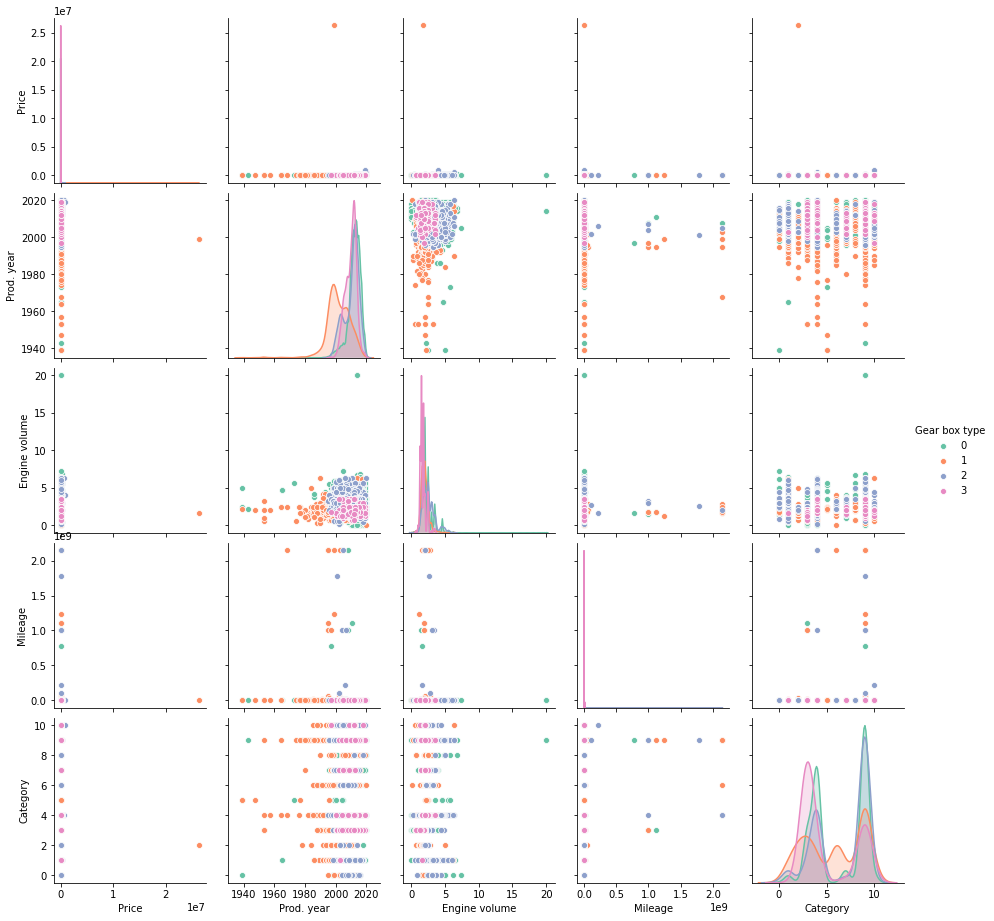

In [509]:
cols_plot=['Price','Prod. year','Engine volume','Gear box type','Mileage','Category']
sns.pairplot(df[cols_plot],hue='Gear box type',palette='Set2')

In [510]:
#удаление выбросов по цене
q1=df.Price.quantile(0.25)
q3=df.Price.quantile(0.75)
df=df[(df.Price<(q3 + 1.5 * (q3-q1)))&((df.Price>(q1 - 1.5 * (q3-q1))))]

#удаление выбросов по пробегу автомобилей
q1=df.Mileage.quantile(0.25)
q3=df.Mileage.quantile(0.75)
df=df[(df.Mileage<(q3 + 1.5 * (q3-q1)))&((df.Mileage>(q1 - 1.5 * (q3-q1))))]

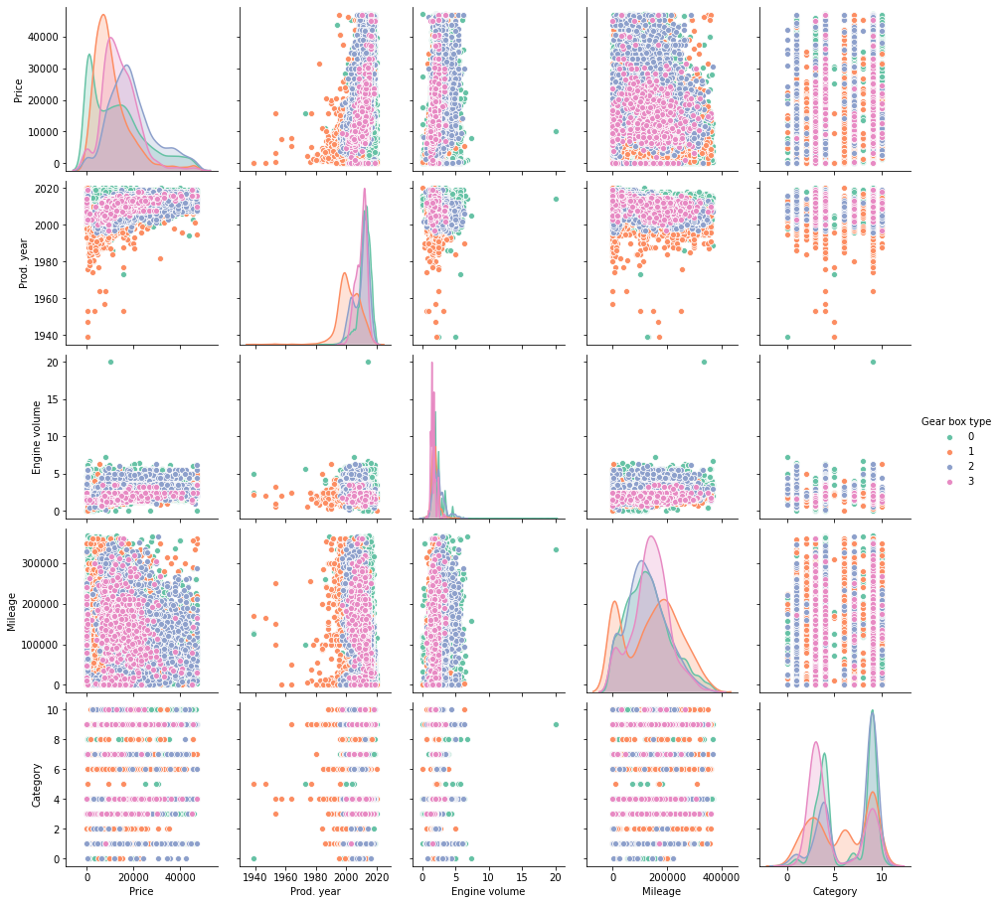

In [511]:
cols_plot=['Price','Prod. year','Engine volume','Gear box type','Mileage','Category']
sns.pairplot(df[cols_plot],hue='Gear box type',palette='Set2')

In [512]:
y=df['Gear box type']
X=df.drop(columns='Gear box type')

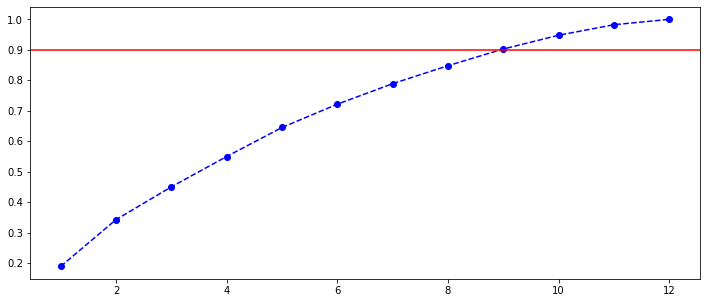

In [513]:
X_scaled=StandardScaler().fit_transform(X)

pca=PCA().fit(X_scaled)

plt.figure(figsize=(12,5))
x=np.arange(1,len(pca.explained_variance_ratio_)+1,1)
plt.plot(x,np.cumsum(pca.explained_variance_ratio_),marker='o',linestyle='--',color='b')
plt.axhline(y=0.9,color='r')


In [514]:
pca = PCA(n_components=6).fit(X_scaled)

components = pca.fit_transform(X_scaled)
total_var = pca.explained_variance_ratio_.sum() * 100
n_components = len(pca.explained_variance_ratio_)

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
labels['color'] = 'Median Price'
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    dimensions=range(n_components),
    labels=labels,
    title=f'Total Explained Variance: {total_var:.2f}%',
)
fig.update_traces(marker_size=1, diagonal_visible=False)

fig.update_layout(
    font=dict(size=10, color='black'),
    autosize=False,
    width=1000,
    height=800,
)
fig.show()

In [515]:
pca = PCA(n_components=3, random_state=42)
X_pca = pca.fit_transform(X_scaled)

fig = px.scatter_3d(
    X_pca, x=0, y=1, z=2,
    labels={'color': 'species'}
)
fig.update_traces(marker_size=2)
fig.show()

# PCA 9 компонент

In [436]:
pca = PCA(n_components=9, random_state=42)
X_pca = pca.fit_transform(X_scaled)

# K-Means без всего на X_scaled

In [437]:
km=KMeans(n_clusters=4)
km.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=km.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=km.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=km.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=km.labels_)))

homogeneity_score: 0.13459904924814534
completeness_score: 0.11605721838878721
v_measure_score: 0.12464233510523595
silhouette_score: 0.22445939391704509


# K-Means без всего на X_pca

In [438]:
km=KMeans(n_clusters=4)
km.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=km.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=km.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=km.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=km.labels_)))

homogeneity_score: 0.13274957329958856
completeness_score: 0.1147996803949957
v_measure_score: 0.12312384998071377
silhouette_score: 0.24214682516877029


# K-Means с k-means++ на X_scaled

In [439]:
km=KMeans(n_clusters=4,init='k-means++')
km.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=km.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=km.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=km.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=km.labels_)))

homogeneity_score: 0.13443775831422694
completeness_score: 0.11592624542217252
v_measure_score: 0.1244976460813481
silhouette_score: 0.22447603553766385


# K-Means с k-means++ на X_pca

In [440]:
km=KMeans(n_clusters=4,init='k-means++')
km.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=km.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=km.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=km.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=km.labels_)))

homogeneity_score: 0.1320641767873295
completeness_score: 0.11431203435172031
v_measure_score: 0.12254855810754146
silhouette_score: 0.242366497531327


# Mini Batch K-Means без всего на X_scaled

In [441]:
mbkm=MiniBatchKMeans(n_clusters=4)
mbkm.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=mbkm.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=mbkm.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=mbkm.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=mbkm.labels_)))

homogeneity_score: 0.08078096872451414
completeness_score: 0.058982893765938335
v_measure_score: 0.06818207813787473
silhouette_score: 0.1614591357135419


# Mini Batch K-Means без всего на X_pca

In [442]:
mbkm=MiniBatchKMeans(n_clusters=4)
mbkm.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=mbkm.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=mbkm.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=mbkm.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=mbkm.labels_)))

homogeneity_score: 0.12414314557224634
completeness_score: 0.08417645391444792
v_measure_score: 0.10032593954486985
silhouette_score: 0.13588056990158623


# Mini Batch K-Means с k-means++ на X_scaled

In [443]:
mbkm=MiniBatchKMeans(n_clusters=4,init='k-means++')
mbkm.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=mbkm.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=mbkm.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=mbkm.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=mbkm.labels_)))

homogeneity_score: 0.12756540068830585
completeness_score: 0.08820550134796758
v_measure_score: 0.10429552841629043
silhouette_score: 0.12646741807443992


# Mini Batch K-Means с k-means++ на X_pca

In [444]:
mbkm=MiniBatchKMeans(n_clusters=4,init='k-means++')
mbkm.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=mbkm.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=mbkm.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=mbkm.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=mbkm.labels_)))

homogeneity_score: 0.16625106858641944
completeness_score: 0.129245580167124
v_measure_score: 0.14543119797461623
silhouette_score: 0.22314545140816397


# Иерархическая кластеризация с single на X_scaled

In [445]:
ac=AgglomerativeClustering(n_clusters=4, linkage='single')
ac.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=ac.labels_)))

homogeneity_score: 0.00034314029670067555
completeness_score: 0.12781436763372694
v_measure_score: 0.0006844430847743302
silhouette_score: 0.5275727383385833


# Иерархическая кластеризация с single на X_pca

In [446]:
ac=AgglomerativeClustering(n_clusters=4, linkage='single')
ac.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=ac.labels_)))

homogeneity_score: 9.10383509462447e-05
completeness_score: 0.033910354943714964
v_measure_score: 0.0001815891935559229
silhouette_score: 0.4747054453921784


# Иерархическая кластеризация с average на X_scaled

In [447]:
ac=AgglomerativeClustering(n_clusters=4, linkage='average')
ac.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=ac.labels_)))

homogeneity_score: 0.001299447463397865
completeness_score: 0.14672456018438337
v_measure_score: 0.002576080199144942
silhouette_score: 0.5826011942265614


# Иерархическая кластеризация с average на X_pca

In [448]:
ac=AgglomerativeClustering(n_clusters=4, linkage='average')
ac.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=ac.labels_)))

homogeneity_score: 0.0016049467819435185
completeness_score: 0.13749653992499744
v_measure_score: 0.003172857954364076
silhouette_score: 0.4636655631781823


# Иерархическая кластеризация с ward на X_scaled

In [449]:
ac=AgglomerativeClustering(n_clusters=4, linkage='ward')
ac.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=ac.labels_)))

homogeneity_score: 0.054173724618093236
completeness_score: 0.056644453467973706
v_measure_score: 0.055381546174367594
silhouette_score: 0.2282166483950398


# Иерархическая кластеризация с ward на X_pca

In [450]:
ac=AgglomerativeClustering(n_clusters=4, linkage='ward')
ac.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=ac.labels_)))

homogeneity_score: 0.06169793072313289
completeness_score: 0.061008186557618097
v_measure_score: 0.0613511200776355
silhouette_score: 0.25570323872855955


# Иерархическая кластеризация с матрицей смежности на X_scaled

In [451]:
connectivity = kneighbors_graph(X_scaled, n_neighbors=6, include_self=False)
connectivity = 0.5 * (connectivity + connectivity.T)

In [452]:
ac = AgglomerativeClustering(n_clusters=4,connectivity=connectivity)
ac.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=ac.labels_)))

D:\Users\Ivan\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning:

the number of connected components of the connectivity matrix is 58 > 1. Completing it to avoid stopping the tree early.



homogeneity_score: 0.05820302267517126
completeness_score: 0.06260384374832131
v_measure_score: 0.060323275408256924
silhouette_score: 0.25192347895992856


# Иерархическая кластеризация с матрицей смежности на X_pca

In [453]:
ac = AgglomerativeClustering(n_clusters=4,connectivity=connectivity)
ac.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=ac.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=ac.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=ac.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=ac.labels_)))

D:\Users\Ivan\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:245: UserWarning:

the number of connected components of the connectivity matrix is 58 > 1. Completing it to avoid stopping the tree early.



homogeneity_score: 0.05846449606870587
completeness_score: 0.06515198048740427
v_measure_score: 0.06162734634076533
silhouette_score: 0.26101404444360315


# EM кластеризация на X_scaled

In [454]:
gm = GaussianMixture(n_components=4)
y_pred = gm.fit_predict(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=y_pred)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=y_pred)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=y_pred)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=y_pred)))

homogeneity_score: 0.0729467235211708
completeness_score: 0.06255460242886973
v_measure_score: 0.06735215698240413
silhouette_score: 0.1800115050289442


# EM кластеризация на X_pca

In [455]:
gm = GaussianMixture(n_components=4)
y_pred = gm.fit_predict(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=y_pred)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=y_pred)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=y_pred)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=y_pred)))

homogeneity_score: 0.0738149555935938
completeness_score: 0.0505495663651109
v_measure_score: 0.06000608433577332
silhouette_score: 0.126463666772763


# EM кластеризация c init_params='random' на X_scaled

In [456]:
gm = GaussianMixture(n_components=4, init_params='random')
y_pred = gm.fit_predict(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=y_pred)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=y_pred)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=y_pred)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=y_pred)))

homogeneity_score: 0.05402433828717964
completeness_score: 0.09822808680454803
v_measure_score: 0.06970933156084984
silhouette_score: 0.24214993801218948


# EM кластеризация c init_params='random' на X_pca

In [457]:
gm = GaussianMixture(n_components=4, init_params='random')
y_pred = gm.fit_predict(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=y_pred)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=y_pred)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=y_pred)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=y_pred)))

homogeneity_score: 0.1469799053103377
completeness_score: 0.10572056615209263
v_measure_score: 0.12298195339694934
silhouette_score: 0.10804229369869381


# Mean-shift на X_scaled

In [484]:
bandwidth = estimate_bandwidth(X_scaled, quantile=0.3, n_samples=300)

MS = MeanShift(bandwidth=bandwidth)
MS.fit(X_scaled)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=MS.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=MS.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=MS.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=y_pred)))

homogeneity_score: 0.03746961743752769
completeness_score: 0.1337617207675277
v_measure_score: 0.058540691878990324
silhouette_score: 0.10804229369869381


# Mean-shift на X_pca

In [483]:
bandwidth = estimate_bandwidth(X_pca, quantile=0.3, n_samples=300)

MS = MeanShift(bandwidth=bandwidth)
MS.fit(X_pca)
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=MS.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=MS.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=MS.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=MS.labels_)))

homogeneity_score: 0.032475656619374245
completeness_score: 0.13527011949825538
v_measure_score: 0.0523767102023068
silhouette_score: 0.3343224435021758


# DBSCAN default на X_scaled

In [459]:
db=DBSCAN(eps=0.5,min_samples=5)
db.fit(X_scaled)
print(pd.Series(db.labels_).value_counts())
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=db.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=db.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=db.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=db.labels_)))

-1      7103
 6      1975
 4      1228
 23      431
 16      407
        ... 
 263       5
 283       4
 254       4
 273       3
 275       3
Length: 286, dtype: int64
homogeneity_score: 0.27848750581005766
completeness_score: 0.08189605660999569
v_measure_score: 0.12657085904719334
silhouette_score: -0.16075285562134167


# DBSCAN default на X_pca

In [460]:
db=DBSCAN(eps=0.5,min_samples=5)
db.fit(X_pca)
print(pd.Series(db.labels_).value_counts())
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=db.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=db.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=db.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=db.labels_)))

-1      5828
 6      2086
 4      1245
 17      583
 23      506
        ... 
 268       4
 115       4
 198       4
 233       4
 263       4
Length: 272, dtype: int64
homogeneity_score: 0.30221807791296385
completeness_score: 0.08272138415070106
v_measure_score: 0.12989002263524788
silhouette_score: -0.162967348496851


# DBSCAN подобраные парамерты на X_scaled

In [480]:
db=DBSCAN(eps=0.9,min_samples=210)
db.fit(X_scaled)
print(pd.Series(db.labels_).value_counts())
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=db.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=db.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=db.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_scaled, labels=db.labels_)))

-1    13876
 1     1256
 0     1176
 3      572
 2      362
dtype: int64
homogeneity_score: 0.058460454444640673
completeness_score: 0.07078208832024088
v_measure_score: 0.06403391578684353
silhouette_score: -0.12518703852023771


# DBSCAN подобраные парамерты на X_pca

In [481]:
db=DBSCAN(eps=0.9,min_samples=210)
db.fit(X_pca)
print(pd.Series(db.labels_).value_counts())
print('homogeneity_score: '+str(homogeneity_score(labels_true=y, labels_pred=db.labels_)))
print('completeness_score: '+str(completeness_score(labels_true=y, labels_pred=db.labels_)))
print('v_measure_score: '+str(v_measure_score(labels_true=y, labels_pred=db.labels_)))
print('silhouette_score: '+str(silhouette_score(X=X_pca, labels=db.labels_)))

-1    12711
 1     2339
 0     1349
 2      469
 3      374
dtype: int64
homogeneity_score: 0.06270574553234419
completeness_score: 0.06436435080638751
v_measure_score: 0.0635242235476242
silhouette_score: -0.10532203826382448


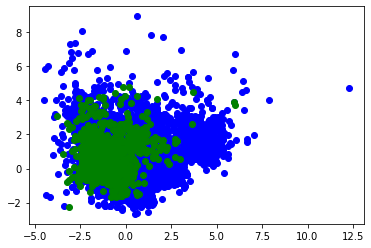

In [219]:
pca = decomposition.PCA(n_components=2)
X_centered = X - X.mean(axis=0)
pca.fit(X_centered)
X_pca = pca.transform(X_centered)

# И нарисуем получившиеся точки в нашем новом пространстве
plt.plot(X_pca[y == 0, 0], X_pca[y == 0, 1], "bo")
plt.plot(X_pca[y == 1, 0], X_pca[y == 1, 1], "go")
plt.plot(X_pca[y == 2, 0], X_pca[y == 2, 1], "ro")
plt.plot(X_pca[y == 3, 0], X_pca[y == 3, 1], "yo")

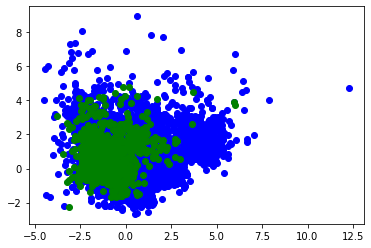

In [174]:
pca = decomposition.PCA(n_components=2)
X_centered = X - X.mean(axis=0)
pca.fit(X_centered)
X_pca = pca.transform(X_centered)

# И нарисуем получившиеся точки в нашем новом пространстве
plt.plot(X_pca[y == 0, 0], X_pca[y == 0, 1], "bo")
plt.plot(X_pca[y == 1, 0], X_pca[y == 1, 1], "go")
plt.plot(X_pca[y == 2, 0], X_pca[y == 2, 1], "ro")
plt.plot(X_pca[y == 3, 0], X_pca[y == 3, 1], "yo")